## Week 2 Assignment : Spatial Data Exploration
### Functional Areas maintained by the Recreation and Parks Department 
### the city of San Francisco
#### Jiaqi Li

For this assignment, I have re-selected a dataset about Functional Areas in the city of San Francisco from [DataSF](https://data.sfgov.org/Culture-and-Recreation/Functional-areas-maintained-by-the-Recreation-and-/um6s-kmkw). This is mainly because the datasets that I selected for week 1 assignment do not contain sufficient information. My goal is to understand where these functional areas are located, as well as the potential hotspot or concentration of different types of these areas.


In [1]:
# importing Pandas and Geopandas libraries
import pandas as pd
import geopandas as gpd

In [2]:
# importing dataset in the csv file as FcnAreas
FcnAreas = gpd.read_file('Functional_Areas_maintained_by_Recreation_and_Parks_Department.csv')

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


In [3]:
# datatype
type(FcnAreas)

geopandas.geodataframe.GeoDataFrame

##### Data exploration
Great. I tried to import both the pandas and the geopandas, the dataset and to identify its type. We got spatial data as expected. Now we can get a general look of the data.

In [4]:
# first impression
FcnAreas.head

<bound method NDFrame.head of                          Map_Label FuncArea_ID SquareFeet PerimeterLength  \
0                 Basketball Court                2332.73          203.41   
1     Decorative Fountain-FOUNTAIN       98918     863.97          192.62   
2        Triumph of Light Monument                 107.11           41.40   
3          Double Dutch Head House                 906.28          145.16   
4                     Double Dutch                8741.88          387.52   
...                            ...         ...        ...             ...   
7891          Buena Vista Roadways               19800.63         2243.32   
7892                    Electrical                9872.60          419.38   
7893                 Male Restroom                9872.60          419.38   
7894                 Rec 2nd Floor                                 419.38   
7895                       Kitchen                                          

          Longitude     Latitude Area_Number 

Eww, very messy. Let's try the command [.info] to see if it shows differently.

In [5]:
FcnAreas.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7896 entries, 0 to 7895
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Map_Label                7896 non-null   object  
 1   FuncArea_ID              7896 non-null   object  
 2   SquareFeet               7896 non-null   object  
 3   PerimeterLength          7896 non-null   object  
 4   Longitude                7896 non-null   object  
 5   Latitude                 7896 non-null   object  
 6   Area_Number              7896 non-null   object  
 7   TMA_Name                 7896 non-null   object  
 8   Facility_ID              7896 non-null   object  
 9   Property_ID              7896 non-null   object  
 10  Floor                    7896 non-null   object  
 11  Functional_Area_Type     7896 non-null   object  
 12  Functional_Area_Subtype  7896 non-null   object  
 13  Gender                   7896 non-null   object  
 14  

Okay! It does improve a bit. We have got 16 'object' and 1 'geometry' as type. Let's just take a look at the first five rows then. I will also figure out the total rows and columns with alternative ways (although they are right above this paragraph). 

In [6]:
# another try
FcnAreas.head(5)

,Map_Label,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Area_Number,TMA_Name,Facility_ID,Property_ID,Floor,Functional_Area_Type,Functional_Area_Subtype,Gender,Comments,shape,geometry
0,Basketball Court,,2332.73,203.41,-122.48342987,37.73875894,,,,,,,,,,MULTIPOLYGON (((-122.48354051938928 37.7387132...,None
1,Decorative Fountain-FOUNTAIN,98918,863.97,192.62,-122.42986402,37.7851231,Fountain,INACTIVE - Fountain,,126,,Decorative Fountain,,,,MULTIPOLYGON (((-122.42985358499318 37.7851507...,None
2,Triumph of Light Monument,,107.11,41.40,-122.44554095,37.76330962,,,,,,,,,,MULTIPOLYGON (((-122.44551673404423 37.7633150...,None
3,Double Dutch Head House,,906.28,145.16,-122.46232499,37.76891637,,,,,,,,,,MULTIPOLYGON (((-122.46242648764645 37.7689206...,None
4,Double Dutch,,8741.88,387.52,-122.46229721,37.76872675,,,,,,,,,,MULTIPOLYGON (((-122.46246489657797 37.7688685...,None


In [7]:
# How many rows and columns?
FcnAreas.shape

(7896, 17)

In [8]:
# what are the columns?
FcnAreas.columns.to_list()

['Map_Label',
 'FuncArea_ID',
 'SquareFeet',
 'PerimeterLength',
 'Longitude',
 'Latitude',
 'Area_Number',
 'TMA_Name',
 'Facility_ID',
 'Property_ID',
 'Floor',
 'Functional_Area_Type',
 'Functional_Area_Subtype',
 'Gender',
 'Comments',
 'shape',
 'geometry']

We ONLY got 7896 rows! But at least we know what are the columns. It seems a bit more clear. We can figure out the datatypes.

In [9]:
# datatypes
FcnAreas.dtypes

Map_Label                    object
FuncArea_ID                  object
SquareFeet                   object
PerimeterLength              object
Longitude                    object
Latitude                     object
Area_Number                  object
TMA_Name                     object
Facility_ID                  object
Property_ID                  object
Floor                        object
Functional_Area_Type         object
Functional_Area_Subtype      object
Gender                       object
Comments                     object
shape                        object
geometry                   geometry
dtype: object

So we've only got two datatypes here: object and geometry. To be honest, I feel like there is not enough information on it. Let's try what we can get in 'gender'.

In [10]:
#figuring out what values are in the column 'gender' as a single column
FcnAreas['Gender'].value_counts()

     7577
2     318
0       1
Name: Gender, dtype: int64

That does not give us a lot information! Looking back at the original dataset, there is not much information in this column. It is hard to get the meaning of these numbers. Let's see what we got for the size of these areas.

In [11]:
# How big can randomly selected areas be?
FcnAreas['SquareFeet'].sample(10)

2507      887.59
6728    13563.04
1403    10728.31
75       1758.95
5655      113.36
4003     1497.89
170       201.69
2537     1033.18
7550      470.93
1700    79943.45
Name: SquareFeet, dtype: object

Let's see how many areas are there for each given size.

In [12]:
#figuring out if there are areas that are of the same size.
FcnAreas['SquareFeet'].value_counts()

            25
9872.60     24
160.00      15
9872.56     14
187.80      10
            ..
24250.28     1
76.74        1
100.57       1
77.40        1
19800.63     1
Name: SquareFeet, Length: 7466, dtype: int64

There are 25 areas without the data for their size in squarefeet. Let's see if some areas perform the same function.

In [13]:
#figuring out if there are areas that are of the same function.
FcnAreas['Functional_Area_Type'].value_counts()

                             6618
Planted Bed                   241
Lawn                          170
Path                          149
Structural                    104
Non-landscaped Greenspace      86
Sidewalk                       59
Retaining Wall                 59
Hardscape Area                 55
Ornamental Garden              53
Stairway or Steps              50
Curb                           33
Table Seating Area             26
Childrens Play Area            24
Natural Area                   18
Bleachers                      16
Ramp                           16
Road                           16
Dog Play Area                  10
Water Body                      9
Interior - Recreational         6
Interior - Storage              6
Community Garden                6
Interior - Administrative       5
Baseball                        5
Softball                        5
Deck                            4
Tunnel                          4
Bridge                          4
Parking       

THere are more than 6000 areas that do not have a specified function in this dataset.

Next we can save it as a variable for future use.

In [14]:
# save it as a variable
FcnArea_type = FcnAreas['Functional_Area_Type'].value_counts()
FcnArea_type

                             6618
Planted Bed                   241
Lawn                          170
Path                          149
Structural                    104
Non-landscaped Greenspace      86
Sidewalk                       59
Retaining Wall                 59
Hardscape Area                 55
Ornamental Garden              53
Stairway or Steps              50
Curb                           33
Table Seating Area             26
Childrens Play Area            24
Natural Area                   18
Bleachers                      16
Ramp                           16
Road                           16
Dog Play Area                  10
Water Body                      9
Interior - Recreational         6
Interior - Storage              6
Community Garden                6
Interior - Administrative       5
Baseball                        5
Softball                        5
Deck                            4
Tunnel                          4
Bridge                          4
Parking       

Above shows that we get some detailed information on types and sizes.

##### Trimming the data into a useful span
Next we want to eliminate the columns that are not so useful. Following that, we try to define and create a new list of desired variables and trim the dataset.

In [15]:
# show a dataframe with a subset of columns
FcnAreas[['FuncArea_ID','SquareFeet','PerimeterLength','Longitude','Latitude','Functional_Area_Type','Functional_Area_Subtype','geometry']]

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
0,,2332.73,203.41,-122.48342987,37.73875894,,,None
1,98918,863.97,192.62,-122.42986402,37.7851231,Decorative Fountain,,None
2,,107.11,41.40,-122.44554095,37.76330962,,,None
3,,906.28,145.16,-122.46232499,37.76891637,,,None
4,,8741.88,387.52,-122.46229721,37.76872675,,,None
...,...,...,...,...,...,...,...,...
7891,,19800.63,2243.32,-122.44194386,37.76703953,,,None
7892,,9872.60,419.38,-122.41281277,37.75819692,,,None
7893,,9872.60,419.38,-122.41281277,37.75819692,,,None
7894,,,419.38,-122.41281268,37.75819677,,,None


In [16]:
# Trim the data
desired_columns = ['FuncArea_ID','SquareFeet','PerimeterLength','Longitude','Latitude','Functional_Area_Type','Functional_Area_Subtype','geometry']
FcnAreas[desired_columns].sample(5)

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
7606,,5668.05,848.17,-122.42029537,37.80405759,,,None
135,,6421.62,447.52,-122.41730997,37.77994248,,,None
4362,,20.03,24.15,-122.41189385,37.74996098,,,None
4794,,708.49,159.06,-122.437952,37.76440765,,,None
1884,,7023.58,358.16,-122.45782118,37.7791425,,,None


In [17]:
FcnAreas_trimmed = FcnAreas[desired_columns].copy()
FcnAreas_trimmed.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7896 entries, 0 to 7895
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   FuncArea_ID              7896 non-null   object  
 1   SquareFeet               7896 non-null   object  
 2   PerimeterLength          7896 non-null   object  
 3   Longitude                7896 non-null   object  
 4   Latitude                 7896 non-null   object  
 5   Functional_Area_Type     7896 non-null   object  
 6   Functional_Area_Subtype  7896 non-null   object  
 7   geometry                 0 non-null      geometry
dtypes: geometry(1), object(7)
memory usage: 493.6+ KB


We have trimmed the dataset to only 8 columns. We can try if we can only query for those served as 'Lawn'.

In [18]:
# Querying for lawn-function areas.
FcnAreas_trimmed[FcnAreas_trimmed.Functional_Area_Type == 'Lawn']

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
517,13552,78184.37,1393.36,-122.46815663,37.76735439,Lawn,,None
1294,97468,18106.31,1695.11,-122.4994082,37.76503014,Lawn,,None
1592,191136,13248.53,1668.61,-122.39933566,37.7956065,Lawn,,None
1654,93219,62291.81,5013.40,-122.46400216,37.76949972,Lawn,,None
1694,185735,16730.85,885.75,-122.4665956,37.77190091,Lawn,,None
...,...,...,...,...,...,...,...,...
7438,21014,9107.28,6317.83,-122.45370698,37.76867223,Lawn,,None
7715,285,17334.50,7768.37,-122.47197785,37.77594414,Lawn,,None
7718,285,35976.57,7768.37,-122.47197785,37.77594414,Lawn,,None
7722,286,43739.43,,,,Lawn,,None


Yay. We have quiried for 170 areas that serve as lawns as expected.

##### Plotting the data on a map

Next, we try to plot different types of functional areas on a map now. First we want to plot the data directly using Geopandas.

<AxesSubplot: >

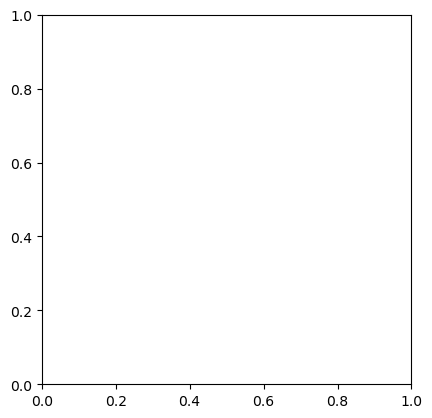

In [19]:
# Plotting trimmed data
FcnAreas_trimmed.plot()

It doesn't show at all. Figuring out why.

In [20]:
# Determing the values in geometry shown as points
FcnAreas_trimmed.geometry

0       None
1       None
2       None
3       None
4       None
        ... 
7891    None
7892    None
7893    None
7894    None
7895    None
Name: geometry, Length: 7896, dtype: geometry

Okay. It is because the original dataset does not inlcude info of longitude and laptitude into the geometry column. BAD.
Is there a way to put the data on the Lon and Lat column into the 'geometry' column? Looked up the following code on geopandas website. I am trying to eliminate columns with no data in Lon and Lat.

In [23]:
# Eliminating those rows without data in Longitude and Latitude (method 1)

FcnAreas_trimmed.dropna(axis='rows', subset=['Longitude', 'Latitude'], thresh=1)

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
0,,2332.73,203.41,-122.48342987,37.73875894,,,None
1,98918,863.97,192.62,-122.42986402,37.7851231,Decorative Fountain,,None
2,,107.11,41.40,-122.44554095,37.76330962,,,None
3,,906.28,145.16,-122.46232499,37.76891637,,,None
4,,8741.88,387.52,-122.46229721,37.76872675,,,None
...,...,...,...,...,...,...,...,...
7891,,19800.63,2243.32,-122.44194386,37.76703953,,,None
7892,,9872.60,419.38,-122.41281277,37.75819692,,,None
7893,,9872.60,419.38,-122.41281277,37.75819692,,,None
7894,,,419.38,-122.41281268,37.75819677,,,None


It did not work. The numbers of columns have not reduced. This is because, under the columns of 'Lon' and 'Lat', there is empty string, which is not in the type 'float', which then can not be extracted and pulled into the 'geometry' column as data of points. It is also why the following function does not work.

In [22]:
#Extracting Longitude and Latitude data to the column 'geometry'
FcnAreas_trimmed.geometry = gpd.points_from_xy(FcnAreas_trimmed['Longitude'], FcnAreas_trimmed['Latitude'])

ValueError: could not convert string to float: ''

The above error report says that it cannot convert string to float. This may suggest that the empty 'block' under these two columns are empty string. I went back to the sample of trimmed dataset, and found out that there is no data for some areas in terms of Lon and Lat. To prove my thoughts, I will first determine the data types.

In [24]:
# Figuring out the datatypes of the columns Lon and Lat 
FcnAreas_trimmed.dtypes

FuncArea_ID                  object
SquareFeet                   object
PerimeterLength              object
Longitude                    object
Latitude                     object
Functional_Area_Type         object
Functional_Area_Subtype      object
geometry                   geometry
dtype: object

If there is only numbers in 'Lon' and 'Lat', the datatype should be 'float'. But in our 'Lon' and 'Lat', it shows 'object', which may suggest that there is both 'number' and 'empty string' under these two columns. To prove this, I will try to see if there is any empty string in the 'Longitude' column.

In [25]:
# Quering for rows that have 'empty string' for Longitude
FcnAreas_trimmed[FcnAreas_trimmed.Longitude == '']

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
7722,286,43739.43,,,,Lawn,,None
7724,,,,,,,,None
7788,,,,,,,,None
7799,,,,,,,,None
7800,,,,,,,,None
7803,,,,,,,,None
7804,,,,,,,,None
7805,,,,,,,,None
7806,,,,,,,,None
7807,,,,,,,,None


It is true that there are 20+ rows or so that do not include data under the Longitude column. 

Next I want to keep the areas with actual data under the Lon and Lat column.

In [26]:
# Getting rid of the areas without Longitude and Latitude data
FcnAreas_trimmed = FcnAreas_trimmed[(FcnAreas_trimmed.Longitude != '') & (FcnAreas_trimmed.Latitude !='')]
FcnAreas_trimmed

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
0,,2332.73,203.41,-122.48342987,37.73875894,,,None
1,98918,863.97,192.62,-122.42986402,37.7851231,Decorative Fountain,,None
2,,107.11,41.40,-122.44554095,37.76330962,,,None
3,,906.28,145.16,-122.46232499,37.76891637,,,None
4,,8741.88,387.52,-122.46229721,37.76872675,,,None
...,...,...,...,...,...,...,...,...
7889,,9872.60,419.38,-122.41281277,37.75819692,,,None
7891,,19800.63,2243.32,-122.44194386,37.76703953,,,None
7892,,9872.60,419.38,-122.41281277,37.75819692,,,None
7893,,9872.60,419.38,-122.41281277,37.75819692,,,None


We see that the rows are reduced from 7896 to 7871.

Next, we input the data of Longitude and Latitude into the geometry column first, and we try to plot it.

In [29]:
#Extracting Longitude and Latitude data to the column 'geometry'
FcnAreas_trimmed.geometry = gpd.points_from_xy(FcnAreas_trimmed['Longitude'], FcnAreas_trimmed['Latitude'])
FcnAreas_trimmed.geometry

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


0       POINT (-122.48343 37.73876)
1       POINT (-122.42986 37.78512)
2       POINT (-122.44554 37.76331)
3       POINT (-122.46232 37.76892)
4       POINT (-122.46230 37.76873)
                   ...             
7889    POINT (-122.41281 37.75820)
7891    POINT (-122.44194 37.76704)
7892    POINT (-122.41281 37.75820)
7893    POINT (-122.41281 37.75820)
7894    POINT (-122.41281 37.75820)
Name: geometry, Length: 7871, dtype: geometry

<AxesSubplot: >

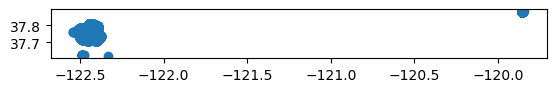

In [30]:
# Plotting data with gpd
FcnAreas_trimmed.plot()

It finally comes out. We would like to eliminate the outlier to show a prettier plotting.

<AxesSubplot: >

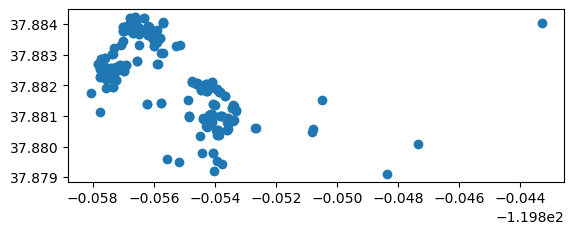

In [31]:
# Keeping the data that has longitude less that -122.0
FcnAreas_trimmed[FcnAreas_trimmed.Longitude < '-122.0'].plot()

<AxesSubplot: >

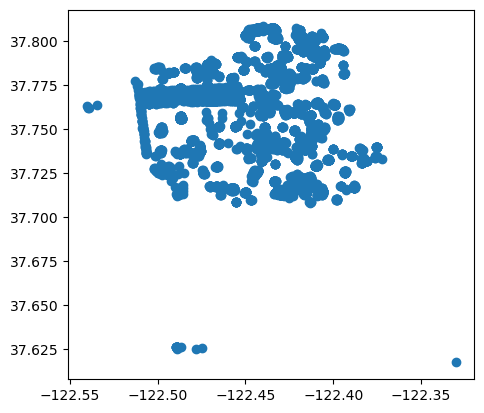

In [32]:
 FcnAreas_trimmed[(FcnAreas_trimmed.geometry.x < -122.0) & (FcnAreas_trimmed.geometry.y > 37)].plot()

A relative clear plotting. 

Next we try to color it and add a legend.

<AxesSubplot: >

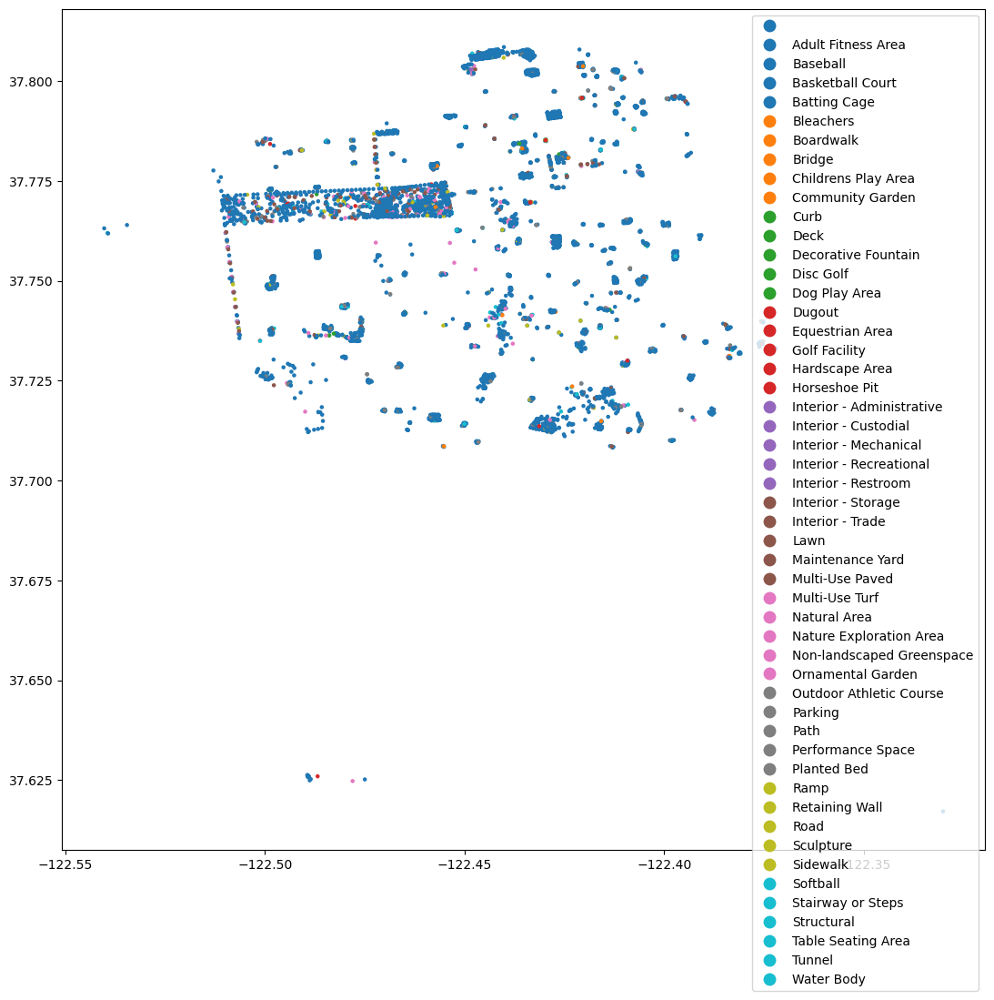

In [33]:
# Plotting the areas in color
FcnAreas_trimmed[(FcnAreas_trimmed.geometry.x < -122.0) & (FcnAreas_trimmed.geometry.y > 37)].plot(
      figsize=(20,12),   #size of the plot
            column = 'Functional_Area_Type',   # column that defines the color of the dots
            legend = True,     # add a legend
            markersize = 5,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
)

This already looks pretty good. However, I have noticed that there is a majority of the areas that lack information regarding the area type. I have decided to eliminate them for the purpose of this activity. I want see the distribution of those areas with a specified functional type.

In [34]:
# Trimming the dataset again, keeing those with specific types of functional areas
FcnAreas_trimmed = FcnAreas_trimmed[(FcnAreas_trimmed.Functional_Area_Type != '')]
FcnAreas_trimmed

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry
1,98918,863.97,192.62,-122.42986402,37.7851231,Decorative Fountain,,POINT (-122.42986 37.78512)
5,89464,24941.84,2551.47,-122.5002416,37.72610211,Planted Bed,Perennial Bed,POINT (-122.50024 37.72610)
9,89522,27928.72,2700.28,-122.50003095,37.78512654,Path,,POINT (-122.50003 37.78513)
18,89534,3176.43,322.93,-122.49993065,37.78510272,Parking,,POINT (-122.49993 37.78510)
62,90252,383.48,321.45,-122.50643361,37.73659426,Path,,POINT (-122.50643 37.73659)
...,...,...,...,...,...,...,...,...
7851,108212,13734.96,33605.29,-122.44093442,37.76847423,Non-landscaped Greenspace,,POINT (-122.44093 37.76847)
7855,1258527,9872.60,419.38,-122.41281277,37.75819692,Structural,"Building (shell, exterior walls)",POINT (-122.41281 37.75820)
7861,74512,74158.94,2246.05,-122.44140169,37.76781872,Lawn,,POINT (-122.44140 37.76782)
7864,10096,19515.44,775.74,-122.39717821,37.75615794,Structural,"Building (shell, exterior walls)",POINT (-122.39718 37.75616)


<AxesSubplot: >

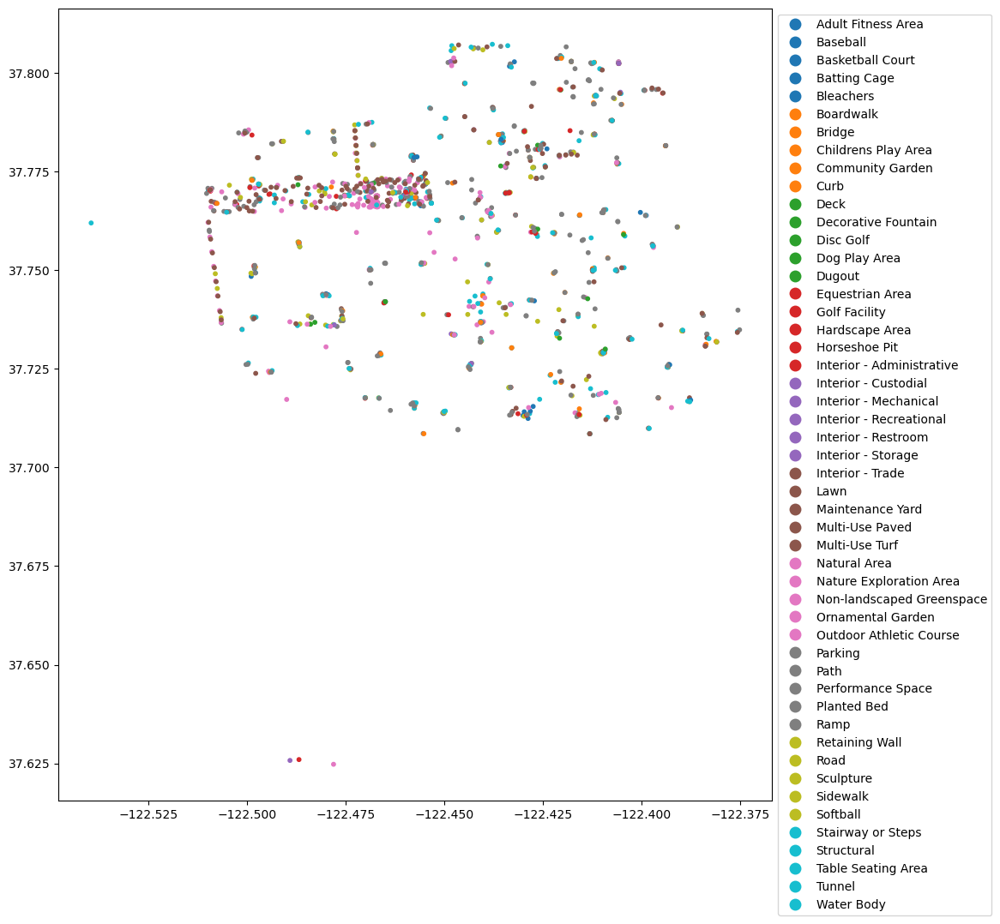

In [35]:
# Plotting the areas with specified functional types in color
FcnAreas_trimmed[(FcnAreas_trimmed.geometry.x < -122.0) & (FcnAreas_trimmed.geometry.y > 37)].plot(
      figsize=(20,12),   #size of the plot
            column = 'Functional_Area_Type',   # column that defines the color of the dots
            legend = True,     # add a legend
            markersize = 10,
            legend_kwds={
               'loc': 'upper left',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
)

##### Plotting it on an interactive map

Now that we have basic plotting, I will project them on the map of SF. I will first import Folium, get the average Latitude and Longitude of the plotted map that we made above, and zoom in in Folium with that data.

In [36]:
# Get the average Lat and Lon, project it on SF in Folium.
import folium

In [37]:
# Determing the datatype, to make sure that the average Lon and Lat can be calculated.
FcnAreas_trimmed.Latitude.dtypes

dtype('O')

In [39]:
# Converting the datatype to float so that it is calculable.
FcnAreas_trimmed['Latitude'] = FcnAreas_trimmed['Latitude'].astype(float)
FcnAreas_trimmed['Longitude'] = FcnAreas_trimmed['Longitude'].astype(float)

In [40]:
# Average Lon and Lat

latitude = FcnAreas_trimmed.Latitude.mean()
latitude

37.76083467206274

In [41]:
longitude = FcnAreas_trimmed.Longitude.mean()
longitude

-122.44506848542746

In [42]:
# Showing them on the folium map

m = folium.Map(location=[latitude,longitude])
m

Now that we get a map from folium. I will try to create markers for these specified functional areas.

For that I will need to do a loop of data and put it on the folium map.

In [44]:
# loop for a dataframe
for index, row in FcnAreas_trimmed.iterrows():
    print(row.SquareFeet, row.Latitude, row.Longitude)

863.97 37.7851231 -122.42986402
24941.84 37.72610211 -122.5002416
27928.72 37.78512654 -122.50003095
3176.43 37.78510272 -122.49993065
383.48 37.73659426 -122.50643361
26507.61 37.80081947 -122.41018017
2692.96 37.79242219 -122.41220731
13677.11 37.7344752 -122.37574671
3539.83 37.73489818 -122.37521098
2451.30 37.76330864 -122.4455406
1705.83 37.80282219 -122.43225588
350.92 37.79580658 -122.39629139
22.94 37.77960926 -122.43356717
3756.74 37.78557389 -122.49958662
7223.05 37.77208364 -122.44793012
6161.82 37.72508211 -122.47403475
471.28 37.72640181 -122.44307937
469.26 37.72621427 -122.44344275
275.32 37.7670212 -122.45325269
19053.93 37.71729141 -122.42585805
4457.18 37.76015459 -122.50955957
843.16 37.75982366 -122.50950834
311.80 37.76683082 -122.45752716
3957.13 37.76966187 -122.45966159
8347.66 37.71847759 -122.41100389
21947.23 37.76659309 -122.49818105
28742.43 37.76669717 -122.50308248
9511.42 37.7703254 -122.50922756
931.13 37.77005353 -122.50923214
11811.22 37.77075803 -12

Now we have done a loop of 1700+ rows.

Next we will add folium markers that show the size of the functional areas when one moves mouse over them.

In [51]:
for index, row in FcnAreas_trimmed.iterrows():
    # add folium marker
    folium.Marker([row.Latitude, row.Longitude], popup=row.SquareFeet, tooltip=row.SquareFeet+'sqft').add_to(m)
m

We have successfully shown an interactive map with different functional areas. If you move your mouse over one area, you can read its size.

Next we will try to colorcode them by different functional types that we know.

In [52]:
# Adding a new column
FcnAreas_trimmed['color'] = ''

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [54]:
# See if the column has been added
FcnAreas_trimmed.sample(5)

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry,color
1634,56334,192361.77,19184.08,-122.441415,37.806309,Path,Asphalt,POINT (-122.44142 37.80631),
3904,1257623,6116.95,962.69,-122.412181,37.784364,Sidewalk,,POINT (-122.41218 37.78436),
4898,10304,8419.89,611.83,-122.460368,37.768705,Interior - Storage,,POINT (-122.46037 37.76870),
2304,1257726,207.16,115.16,-122.389657,37.734586,Ramp,ADA Access Ramp,POINT (-122.38966 37.73459),
480,89460,2168.97,794.59,-122.420272,37.764158,Planted Bed,Perennial Bed,POINT (-122.42027 37.76416),


In [55]:
# find unique values in Functional_Area_type column
FcnAreas_trimmed.Functional_Area_Type.unique()

array(['Decorative Fountain', 'Planted Bed', 'Path', 'Parking',
       'Childrens Play Area', 'Table Seating Area', 'Bleachers',
       'Non-landscaped Greenspace', 'Ornamental Garden',
       'Stairway or Steps', 'Structural', 'Deck', 'Hardscape Area',
       'Tunnel', 'Ramp', 'Interior - Trade', 'Bridge', 'Sidewalk',
       'Natural Area', 'Road', 'Golf Facility', 'Retaining Wall',
       'Dog Play Area', 'Softball', 'Lawn', 'Water Body', 'Sculpture',
       'Community Garden', 'Disc Golf', 'Equestrian Area', 'Baseball',
       'Horseshoe Pit', 'Multi-Use Turf', 'Curb',
       'Outdoor Athletic Course', 'Maintenance Yard', 'Performance Space',
       'Interior - Custodial', 'Interior - Administrative',
       'Multi-Use Paved', 'Basketball Court', 'Interior - Recreational',
       'Interior - Restroom', 'Interior - Mechanical',
       'Interior - Storage', 'Adult Fitness Area', 'Boardwalk',
       'Batting Cage', 'Dugout', 'Nature Exploration Area'], dtype=object)

Now we have a problem, which is that there are too many types in these. I have categorized them in the following orders and will try to see if we can assign a color to each category.

Sports: 
'Childrens Play Area','Softball','Golf Facility','Equestrian Area','Baseball','Outdoor Athletic Course','Horseshoe Pit','Multi-Use Turf','Basketball Court','Adult Fitness Area','Batting Cage','Disc Golf',

Interior:
'Interior - Trade','Interior - Custodial','Interior - Administrative','Interior - Recreational','Interior - Restroom', 'Interior - Mechanical','Interior - Storage',

Greeneries or landscape:
'Planted Bed','Non-landscaped Greenspace','Ornamental Garden','Natural Area','Lawn','Water Body','Sculpture','Decorative Fountain','Nature Exploration Area','Community Garden',

Others: 
'Maintenance Yard','Curb', 'Path','Parking','Table Seating Area','Bleachers','Stairway or Steps','Structural','Deck','Hardscape Area','Tunnel','Ramp','Bridge','Sidewalk','Road','Retaining Wall','Dog Play Area', 'Performance Space','Multi-Use Paved', ''Boardwalk','Dugout', 

In [61]:
# create lists respectively for Sports, Interior, Greeneries_Landscape, Others
Sports=['Childrens Play Area','Softball','Golf Facility','Equestrian Area','Baseball','Outdoor Athletic Course','Horseshoe Pit','Multi-Use Turf','Basketball Court','Adult Fitness Area','Batting Cage','Disc Golf']
Sports
Interior=['Interior - Trade','Interior - Custodial','Interior - Administrative','Interior - Recreational','Interior - Restroom', 'Interior - Mechanical','Interior - Storage']
Interior
Greeneries_Landscape=['Planted Bed','Non-landscaped Greenspace','Ornamental Garden','Natural Area','Lawn','Water Body','Sculpture','Decorative Fountain','Nature Exploration Area','Community Garden']
Greeneries_Landscape
Others=['Maintenance Yard','Curb', 'Path','Parking','Table Seating Area','Bleachers','Stairway or Steps','Structural','Deck','Hardscape Area','Tunnel','Ramp','Bridge','Sidewalk','Road','Retaining Wall','Dog Play Area','Performance Space','Multi-Use Paved','Boardwalk','Dugout']
Others
# display rows that match a query, in the example of Sports
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Sports)]

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry,color
82,498,2692.96,313.54,-122.412207,37.792422,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.41221 37.79242),
132,517,7223.05,984.53,-122.447930,37.772084,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.44793 37.77208),
137,546,6161.82,597.20,-122.474035,37.725082,Childrens Play Area,Children,POINT (-122.47403 37.72508),
410,185,4278410.75,23904.42,-122.498727,37.784258,Golf Facility,18 Hole Golf Course,POINT (-122.49873 37.78426),
468,48,92891.25,1071.00,-122.484468,37.738460,Softball,,POINT (-122.48447 37.73846),
576,497,518.94,118.38,-122.419471,37.744365,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.41947 37.74436),
739,593,7629.10,519.17,-122.498637,37.738073,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.49864 37.73807),
794,514,8112.65,771.88,-122.388020,37.716709,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.38802 37.71671),
906,37,23778.79,622.99,-122.450874,37.783914,Softball,,POINT (-122.45087 37.78391),
1075,23572,630728.96,4847.32,-122.487069,37.771670,Disc Golf,,POINT (-122.48707 37.77167),


The above table shows those that fall into the 'Sports' category.

Now We will assign color to each category.

In [71]:
# Assigning color to each of the four categories
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Sports), 'color'] = 'red'
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Interior), 'color'] = 'lightblue'
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Greeneries_Landscape), 'color'] = 'green'
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Others), 'color'] = 'lightgray'

In [72]:
# Check my work
FcnAreas_trimmed.loc[FcnAreas_trimmed['Functional_Area_Type'].isin(Sports)].sample(3)

,FuncArea_ID,SquareFeet,PerimeterLength,Longitude,Latitude,Functional_Area_Type,Functional_Area_Subtype,geometry,color
6274,1260036,57105.95,2518.39,-122.410790,37.718555,Outdoor Athletic Course,,POINT (-122.41079 37.71856),red
2936,40,61289.52,1784.21,-122.479937,37.744036,Baseball,,POINT (-122.47994 37.74404),red
2299,581,4005.65,381.36,-122.478175,37.785269,Childrens Play Area,Youth 5 - 12 yrs,POINT (-122.47817 37.78527),red


We have checked that for those that fall into the 'Sports' category, they have been assigned a red color.

Now we plot them on an interactive map.

In [73]:
# reset the map 
m = folium.Map(location=[latitude,longitude], tiles='Stamen Terrain', zoom_start=10)

In [77]:
# add the stations with color icons and show the map
for index, row in FcnAreas_trimmed.iterrows():
    tooltip_text = row.Functional_Area_Type
    folium.Marker(
        [row.Latitude,row.Longitude], 
        popup=row.Functional_Area_Type, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)
m

Voila. Above shows an interactive map of different functional areas in the city of San Francisco. Although there is an outlier, the data set is pretty big and I will stop here. Greeneries spaces are relatively spread evenly across the city. Few functional areas are of interior purposes.

Now we will save it on web.

In [78]:
# save the interactive maps as an html file
m.save('FcnAreas_SF.html')